# Module 4 Session 8: Genetic Diversity & Population Structure

**Author**: Shashwat Deepali Nagar

**Date**: May 31, 2024

## Performing a PCA on 1000 Genomes data

In [1]:
library(tidyverse)

── Attaching core tidyverse packages ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


# Reading in sample information

In [2]:
mapping_df <- read_delim(
    '../Data/Session8/1kGP_sampleID_map.txt', 
    delim = '\t'
)

mapping_df %>%
head

Rows: 3500 Columns: 4
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (4): SampleID, Population, Superpopulation, Sex

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


SampleID,Population,Superpopulation,Sex
<chr>,<chr>,<chr>,<chr>
HG00096,GBR,EUR,male
HG00097,GBR,EUR,female
HG00098,GBR,EUR,male
HG00099,GBR,EUR,female
HG00100,GBR,EUR,female
HG00101,GBR,EUR,male


# Downloading the 1kGP chr21 file

We'll use this [link](https://ftp.1000genomes.ebi.ac.uk/vol1/ftp/release/20130502/ALL.chr21.phase3_shapeit2_mvncall_integrated_v5b.20130502.genotypes.vcf.gz) to download the 1kGP chr21 VCF file.

# Running PCA using `plink`

In [3]:
# Converting VCF to PLINK format
system(
    "plink --vcf ../Data/Session8/ALL.chr21.phase3_shapeit2_mvncall_integrated_v5b.20130502.genotypes.vcf.gz --pca --out ../Data/Session8/1kgp_chr21_pca", 
    intern = T)

[1] "PLINK v1.90b7.2 64-bit (11 Dec 2023)           www.cog-genomics.org/plink/1.9/"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [4]:
pca_df <- read_delim(
    '../Data/Session8/1kgp_chr21_pca.eigenvec', 
    delim = ' ',
    col_names = c('SampleID', 'SampleIDDup', paste0('PC', seq(1, 20)))
) %>%
select(
    SampleID,
    PC1, 
    PC2, 
    PC3
) %>%
inner_join(
    mapping_df,
    join_by(SampleID == SampleID)
)


pca_df %>% head

Rows: 2504 Columns: 22
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: " "
chr  (2): SampleID, SampleIDDup
dbl (20): PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, PC10, PC11, PC12, PC1...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


SampleID,PC1,PC2,PC3,Population,Superpopulation,Sex
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
HG00096,-0.0111502,-0.0250958,0.00505752,GBR,EUR,male
HG00097,-0.0122051,-0.0295984,0.01854540,GBR,EUR,female
HG00099,-0.0126694,-0.0255366,0.00732097,GBR,EUR,female
HG00100,-0.0121642,-0.0242321,0.01523130,GBR,EUR,female
HG00101,-0.0135325,-0.0266913,0.01396770,GBR,EUR,male
HG00102,-0.0120426,-0.0252432,0.01222850,GBR,EUR,female


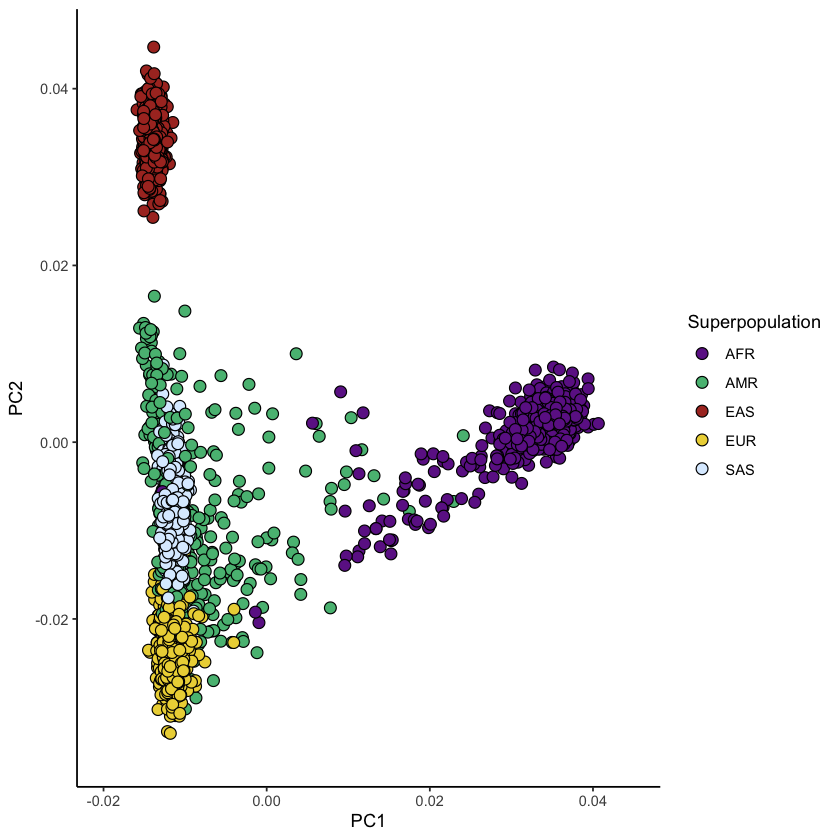

In [5]:
pca_df %>%
ggplot(
    aes(PC1, PC2, fill = Superpopulation)
) +
geom_point(pch = 21, color = 'black', size = 3) +
theme_classic() +
scale_fill_manual(
    values = c(
        'AFR' = '#6E2594',
        'AMR' = '#58BC82',
        'EAS' = '#AB3428',
        'EUR' = '#ECD444',
        'SAS' = '#DCEDFF'
    )
) +
xlim(c(-0.02, 0.045)) +
ylim(c(-0.035, 0.045))

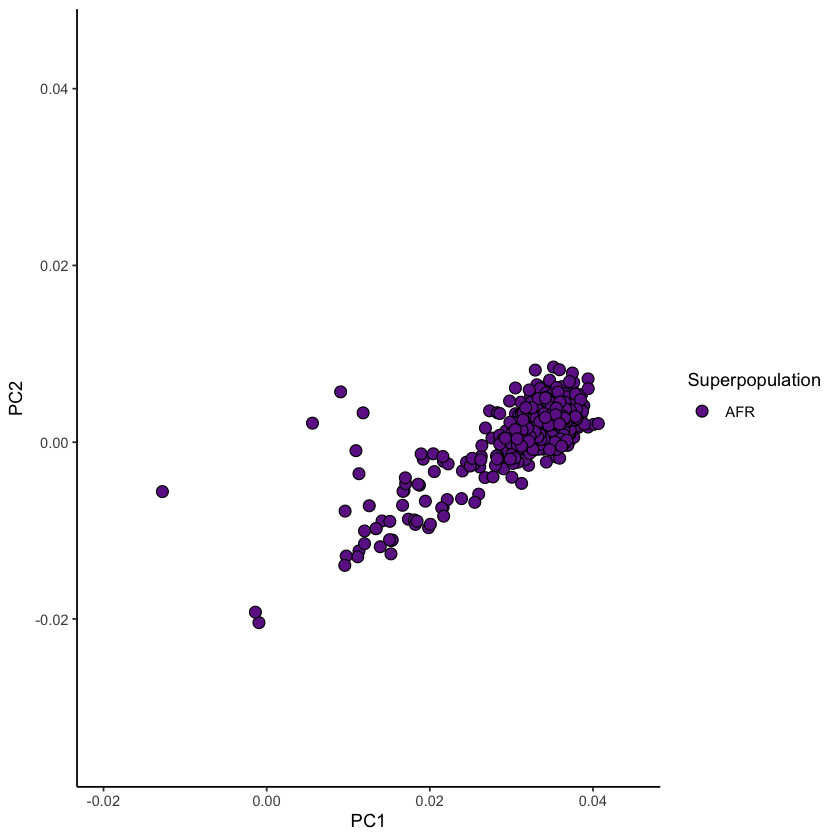

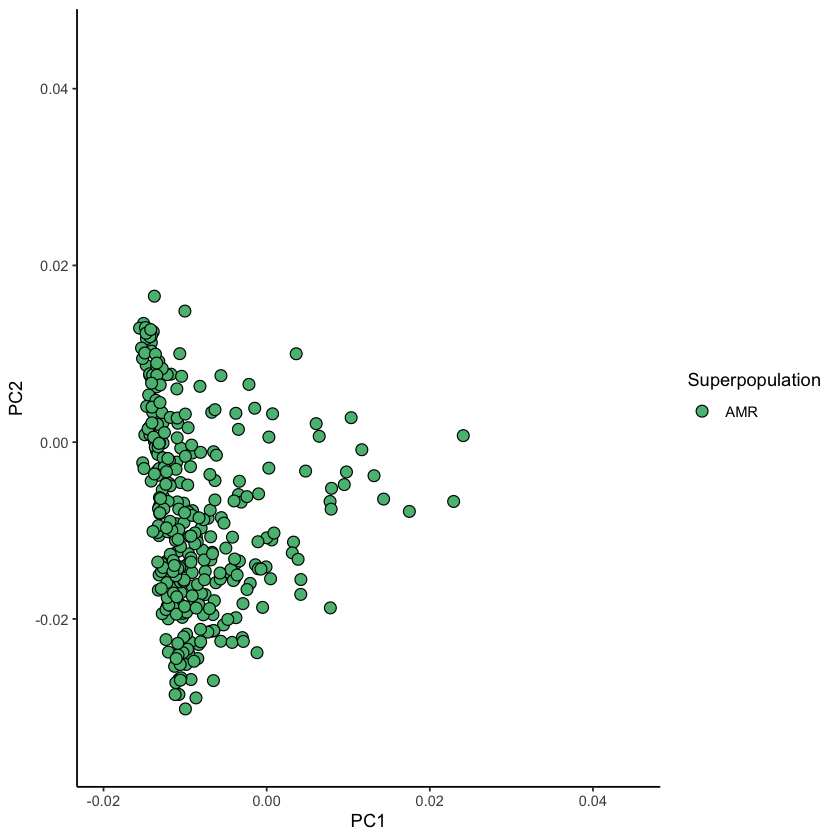

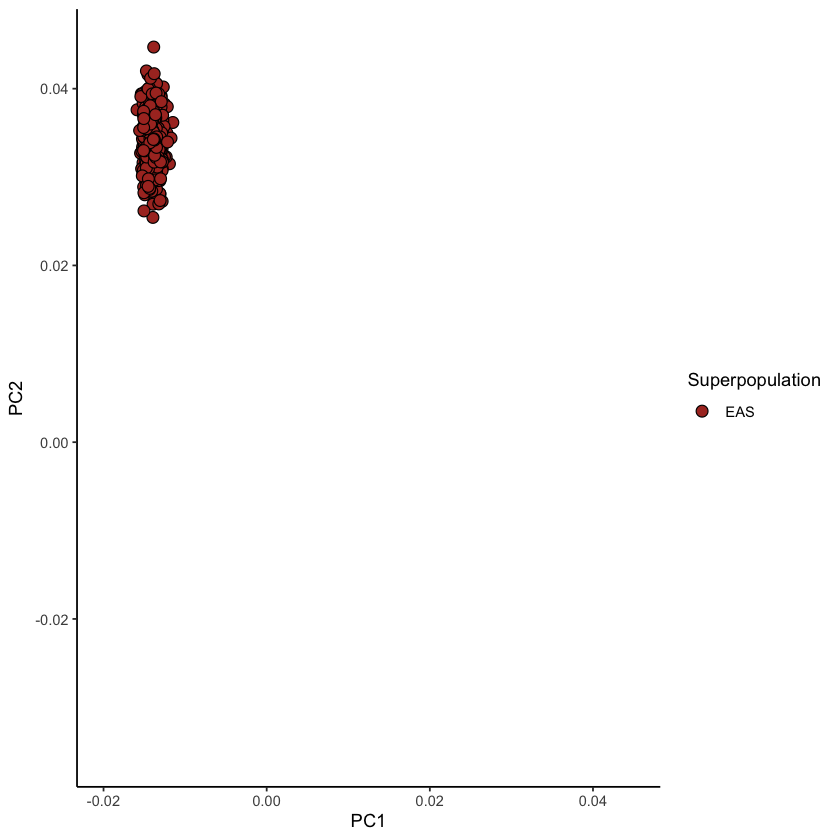

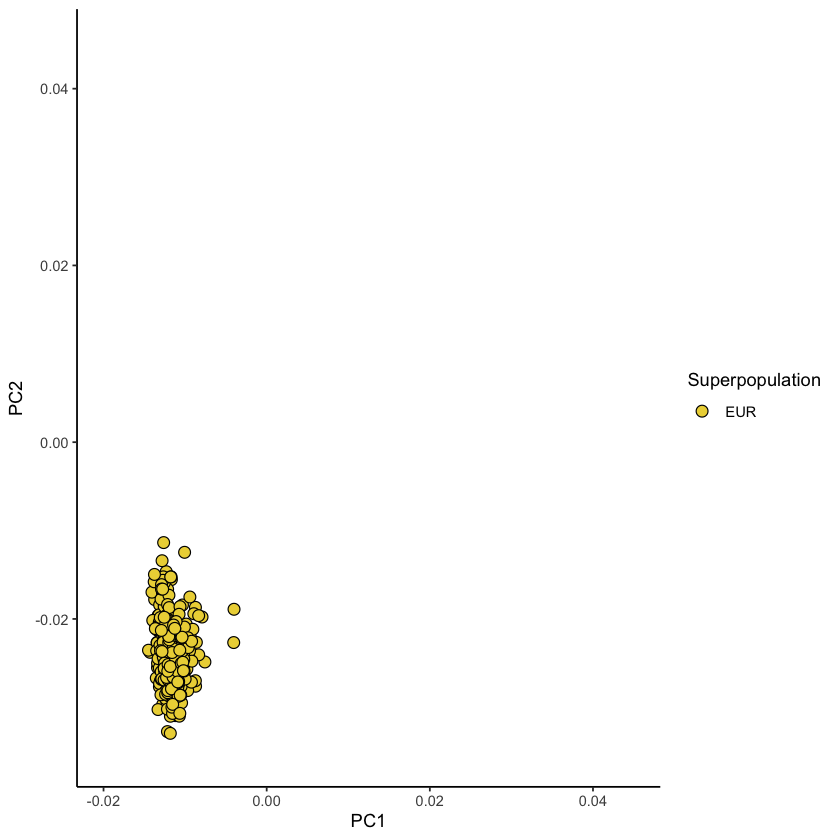

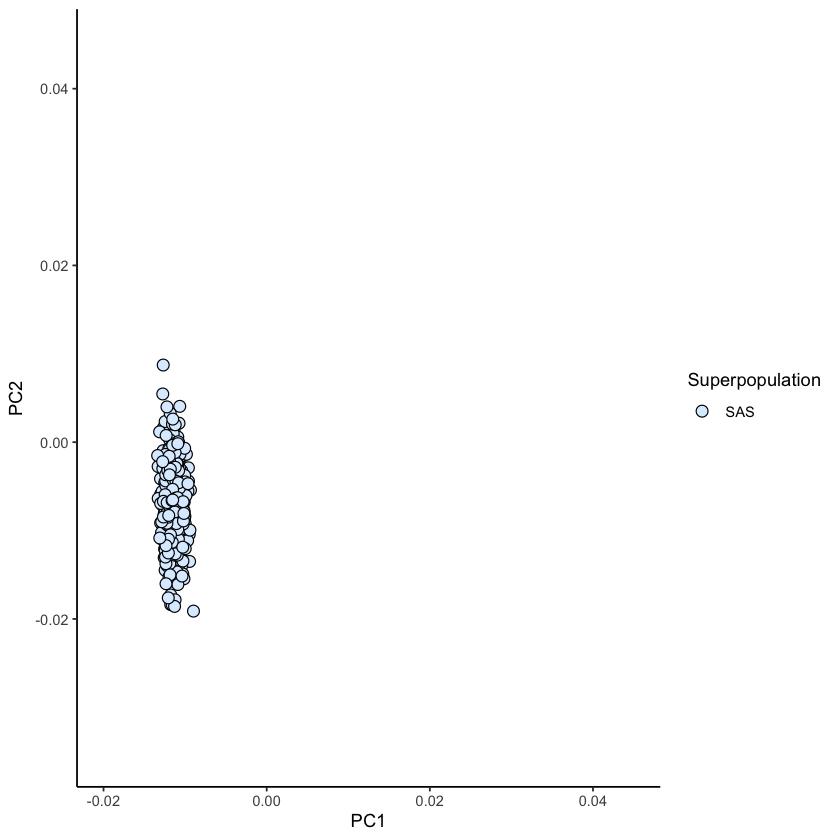

In [6]:
for (curr_pop in c('AFR', 'AMR', 'EAS', 'EUR', 'SAS')) {
    
    curr_plot <- pca_df %>%
    filter(
        Superpopulation == curr_pop
    ) %>%
    ggplot(
        aes(PC1, PC2, fill = Superpopulation)
    ) +
    geom_point(pch = 21, color = 'black', size = 3) +
    theme_classic() +
    scale_fill_manual(
        values = c(
            'AFR' = '#6E2594',
            'AMR' = '#58BC82',
            'EAS' = '#AB3428',
            'EUR' = '#ECD444',
            'SAS' = '#DCEDFF'
        )
    ) +
    xlim(c(-0.02, 0.045)) +
    ylim(c(-0.035, 0.045))
    
    print(curr_plot)
}

